In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
%matplotlib inline

In [3]:
df = pd.read_csv('global air pollution dataset.csv')

In [4]:
df.head()

,Country,City,AQI Value,AQI Category,CO AQI Value,CO AQI Category,Ozone AQI Value,Ozone AQI Category,NO2 AQI Value,NO2 AQI Category,PM2.5 AQI Value,PM2.5 AQI Category
0,Russian Federation,Praskoveya,51,Moderate,1,Good,36,Good,0,Good,51,Moderate
1,Brazil,Presidente Dutra,41,Good,1,Good,5,Good,1,Good,41,Good
2,Italy,Priolo Gargallo,66,Moderate,1,Good,39,Good,2,Good,66,Moderate
3,Poland,Przasnysz,34,Good,1,Good,34,Good,0,Good,20,Good
4,France,Punaauia,22,Good,0,Good,22,Good,0,Good,6,Good


In [5]:
ef = df.drop(['NO2 AQI Value','NO2 AQI Category','CO AQI Value','CO AQI Category'],axis=1, inplace= False)

In [6]:
ef.head()

,Country,City,AQI Value,AQI Category,Ozone AQI Value,Ozone AQI Category,PM2.5 AQI Value,PM2.5 AQI Category
0,Russian Federation,Praskoveya,51,Moderate,36,Good,51,Moderate
1,Brazil,Presidente Dutra,41,Good,5,Good,41,Good
2,Italy,Priolo Gargallo,66,Moderate,39,Good,66,Moderate
3,Poland,Przasnysz,34,Good,34,Good,20,Good
4,France,Punaauia,22,Good,22,Good,6,Good


In [7]:
ef.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23463 entries, 0 to 23462
Data columns (total 8 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Country             23036 non-null  object
 1   City                23462 non-null  object
 2   AQI Value           23463 non-null  int64 
 3   AQI Category        23463 non-null  object
 4   Ozone AQI Value     23463 non-null  int64 
 5   Ozone AQI Category  23463 non-null  object
 6   PM2.5 AQI Value     23463 non-null  int64 
 7   PM2.5 AQI Category  23463 non-null  object
dtypes: int64(3), object(5)
memory usage: 1.4+ MB


In [8]:
ef.describe()

,AQI Value,Ozone AQI Value,PM2.5 AQI Value
count,23463.000000,23463.000000,23463.000000
mean,72.010868,35.193709,68.519755
std,56.055220,28.098723,54.796443
min,6.000000,0.000000,0.000000
25%,39.000000,21.000000,35.000000
50%,55.000000,31.000000,54.000000
75%,79.000000,40.000000,79.000000
max,500.000000,235.000000,500.000000


In [9]:
list(ef.columns)

['Country',
 'City',
 'AQI Value',
 'AQI Category',
 'Ozone AQI Value',
 'Ozone AQI Category',
 'PM2.5 AQI Value',
 'PM2.5 AQI Category']

<Figure size 864x864 with 0 Axes>

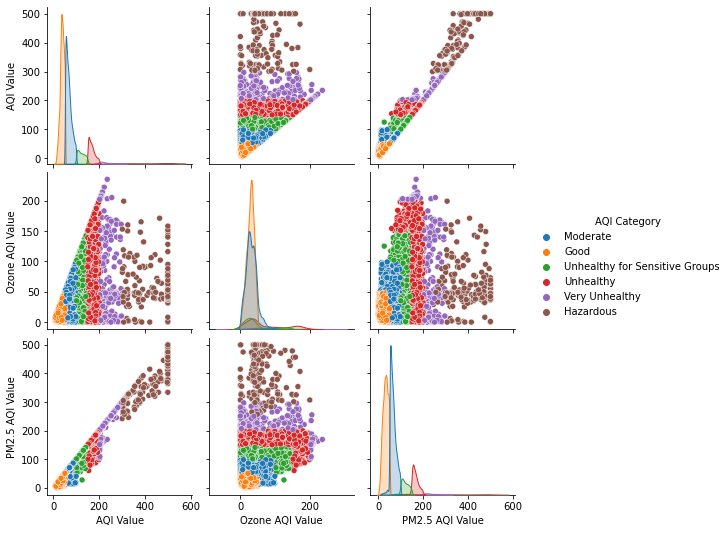

In [10]:
plt.figure(figsize=(12,12))
sns.pairplot(ef, hue='AQI Category')

<AxesSubplot:xlabel='AQI Value', ylabel='Count'>

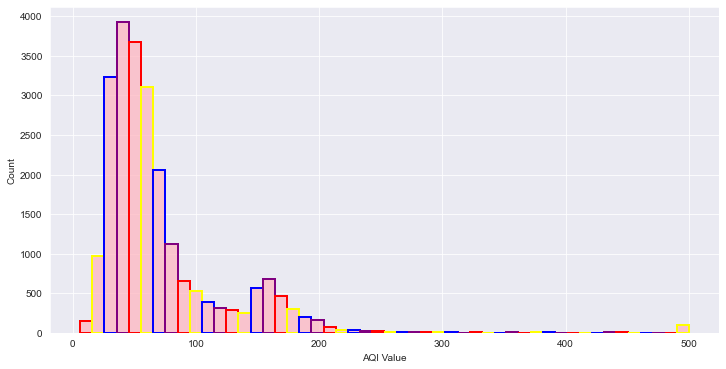

In [11]:
plt.figure(figsize=(12,6))
sns.set_style(style='darkgrid')
edge_colors = ["red", "yellow", "blue", "purple"]
sns.histplot(ef['AQI Value'],bins = 50,color='lightpink',edgecolor=edge_colors,linewidth=2)

In [12]:
ef.corr()

,AQI Value,Ozone AQI Value,PM2.5 AQI Value
AQI Value,1.000000,0.405310,0.984327
Ozone AQI Value,0.405310,1.000000,0.339887
PM2.5 AQI Value,0.984327,0.339887,1.000000


<AxesSubplot:>

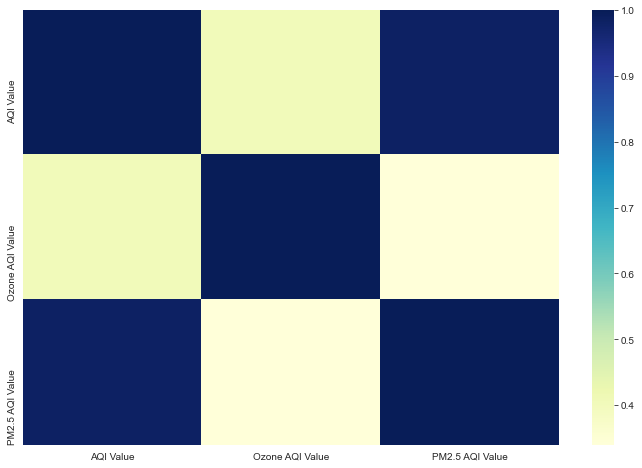

In [13]:
plt.figure(figsize=(12,8))
sns.heatmap(ef.corr(), cmap="YlGnBu")

<Figure size 864x576 with 0 Axes>

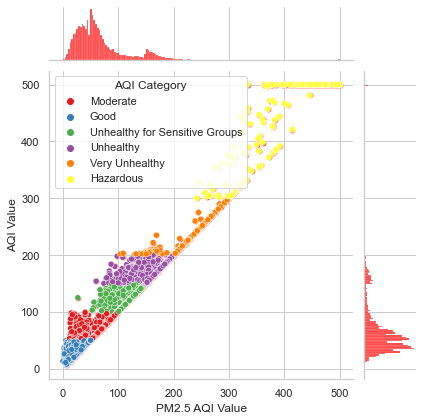

In [14]:
#plt.figure(figsize=(15,15))
#sns.jointplot(x=ef['PM2.5 AQI Value'], y= ef['AQI Value'], ratio = 5,color='red')
plt.figure(figsize=(12,8))
sns.set(style="whitegrid")
g = sns.jointplot(x=ef['PM2.5 AQI Value'], y=ef['AQI Value'], ratio=5, color='red')

sns.scatterplot(data=ef, x='PM2.5 AQI Value', y='AQI Value', hue='AQI Category', palette='Set1', ax=g.ax_joint)

plt.show()

In [15]:
import cufflinks as cf

In [16]:
cf.go_offline()

In [17]:
ef.iplot(kind='scatter', x ='AQI Value', y = 'PM2.5 AQI Value')

In [18]:
df3 = pd.DataFrame({'x':ef['AQI Value'],'y':ef['Ozone AQI Value'],'z':ef['PM2.5 AQI Value']})

In [19]:
df3.scatter_matrix()

In [20]:
df3.iplot(kind='surface',colorscale='rdylbu')

In [21]:
df3.iplot(kind ='spread')

/Users/vinayakkanojia/opt/anaconda3/lib/python3.8/site-packages/cufflinks/plotlytools.py:850: FutureWarning:

The pandas.np module is deprecated and will be removed from pandas in a future version. Import numpy directly instead



In [22]:
df3.iplot(kind='box')

In [23]:
df3['x'].iplot(kind='hist',bins=75, colors='Aqua')

In [24]:
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot


In [25]:
init_notebook_mode(connected=True)

In [26]:
data = dict(type='choropleth',
            locations = df['Country'],
            locationmode = 'ISO-3',
            z = df['AQI Value'],
            colorbar={'title': 'AQI value'},
          )


In [27]:
#layout = dict(geo={'scope': 'world'})

layout = dict(title = 'AQI of this world',
              geo = dict(scope='world',
                         showlakes = True,
                         lakecolor = 'rgb(85,173,240)')
             )

In [28]:
choromap = go.Figure(data = [data],layout = layout)

In [29]:
iplot(choromap)

In [30]:
import plotly.express as px

# Assuming you have a DataFrame 'df' with 'country', 'city', and 'AQI' columns
fig = px.scatter_geo(df, locations="Country", locationmode="country names", 
                     text="City", color="AQI Value",
                     color_continuous_scale="Viridis",
                     projection="natural earth",
                     title="AQI by Country")

# Show the map
fig.show()

In [31]:
df3.head()


,x,y,z
0,51,36,51
1,41,5,41
2,66,39,66
3,34,34,20
4,22,22,6


In [32]:
ef.dropna(inplace = True)

In [33]:
#TRAINING THE MODEL

In [34]:
features = ef[['AQI Value', 'Ozone AQI Value']]
target = ef['PM2.5 AQI Value']

In [35]:
from sklearn.model_selection import train_test_split

In [36]:
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.4, random_state=101)

In [37]:
from sklearn.linear_model import LinearRegression

In [38]:
lm = LinearRegression()

In [39]:
lm.fit(X_train,y_train)

LinearRegression()

In [40]:
print(lm.intercept_)

2.3393085844187596


In [41]:
list(features.columns)

['AQI Value', 'Ozone AQI Value']

In [42]:
coeff_df = pd.DataFrame(lm.coef_,features.columns,columns=['Coefficient'])
coeff_df

,Coefficient
AQI Value,0.987163
Ozone AQI Value,-0.140707


In [43]:
predictions = lm.predict(X_test)

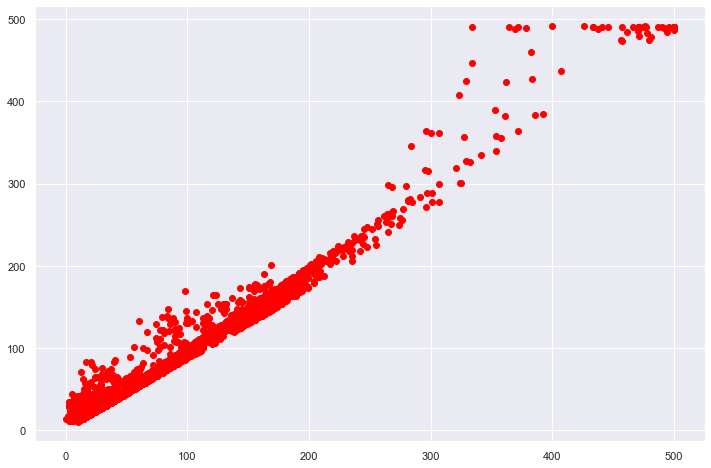

In [44]:
plt.figure(figsize=(12,8))
sns.set_style(style='darkgrid')
plt.scatter(y_test,predictions, color='red')

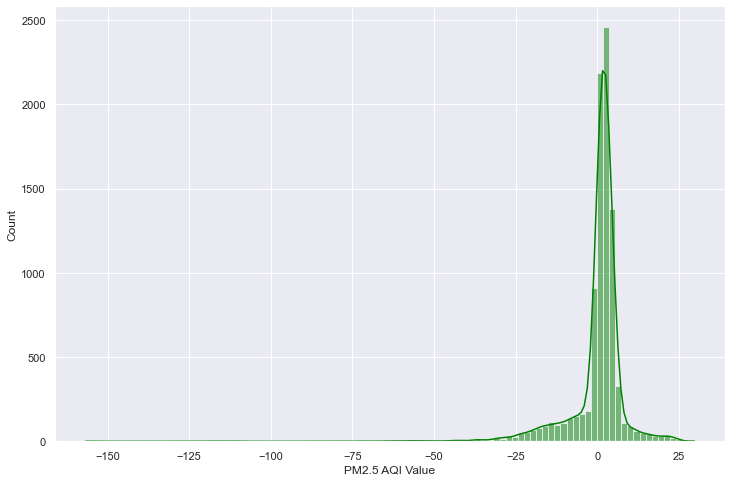

In [45]:
plt.figure(figsize=(12,8))
sns.histplot((y_test-predictions),bins=100,kde=True, color ='green');

In [46]:
from sklearn import metrics

In [47]:
print('MAE:', metrics.mean_absolute_error(y_test, predictions))
print('MSE:', metrics.mean_squared_error(y_test, predictions))
print('RMSE:', np.sqrt(metrics.mean_squared_error(y_test, predictions)))

MAE: 4.88338227486927
MSE: 77.78396330690941
RMSE: 8.819521716448653


In [48]:
new_sample = np.array([25, 35]).reshape(1, -1)
predicted_pm25_aqi = lm.predict(new_sample)
print(f'Predicted PM2.5 AQI Value: {predicted_pm25_aqi[0]}')

Predicted PM2.5 AQI Value: 22.09362294325617
